In [ ]:
!pip install qiskit==0.43.1 qiskit-aer==0.12.0 qiskit-terra==0.24.1 qiskit-ibmq-provider==0.20.2


In [ ]:
!pip install pylatexenc

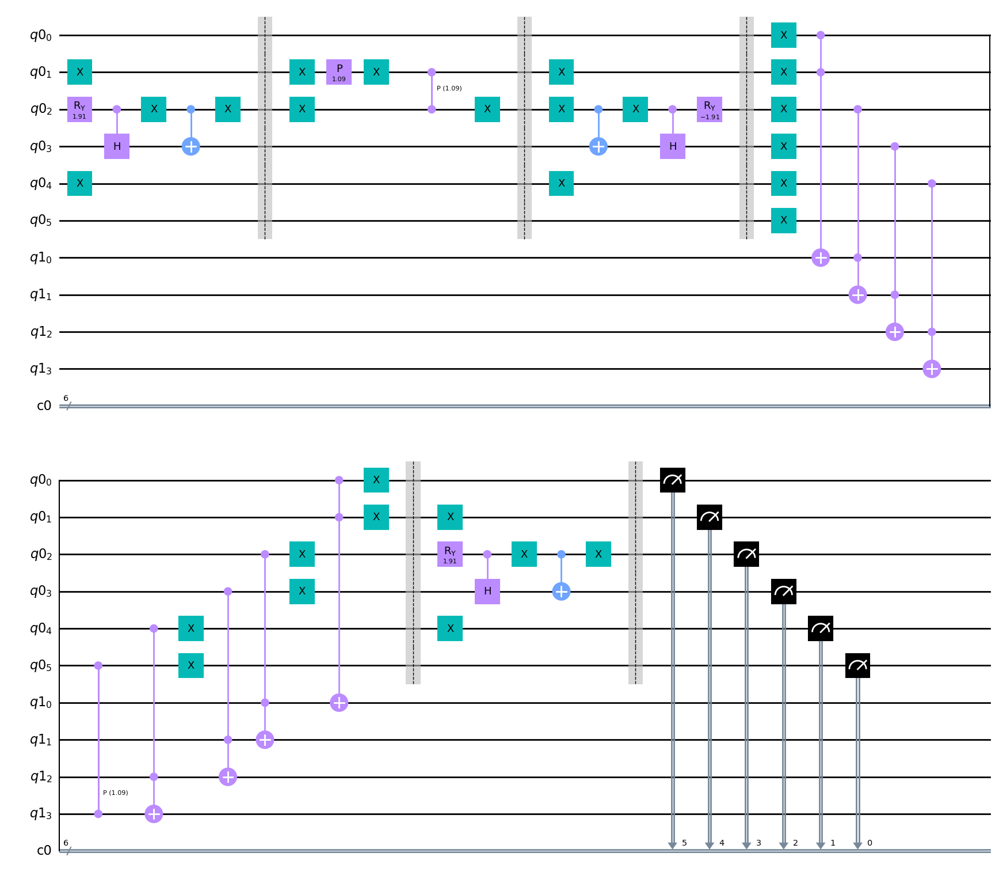

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import math

# importing Qiskit
from qiskit import BasicAer, Aer, execute
from qiskit import QuantumCircuit, ClassicalRegister, QuantumRegister
from qiskit.visualization import plot_histogram

# Define registers
qr = QuantumRegister(6)
anc = QuantumRegister(4)
cr = ClassicalRegister(6)

# Define the circuit
gc = QuantumCircuit(qr, cr, anc)

# Initial states
gc.x(qr[1])
gc.ry(1.9106, qr[2])
gc.ch(2, 3)
gc.x(qr[2])
gc.cx(2, 3)
gc.x(qr[2])
gc.x(qr[4])
gc.barrier(qr)

# Oracle
gc.x(qr[1])
gc.p(1.086, qr[1])  # u1 replaced with p
gc.x(qr[1])

gc.x(qr[2])
gc.cp(1.086, qr[1], qr[2])  # cu1 replaced with cp
gc.x(qr[2])
gc.barrier(qr)

# W^-1
gc.x(qr[1])
gc.x(qr[2])
gc.cx(2, 3)
gc.x(qr[2])
gc.ch(2, 3)
gc.ry(-1.9106, qr[2])
gc.x(qr[4])
gc.barrier(qr)

# I0
gc.x(qr[5])
gc.x(qr[0])
gc.x(qr[1])
gc.x(qr[2])
gc.x(qr[3])
gc.x(qr[4])

# Compute
gc.ccx(qr[0], qr[1], anc[0])
for i in range(2, 5):
    gc.ccx(qr[i], anc[i-2], anc[i-1])

# Copy
gc.cp(1.086, anc[3], qr[5])

# Uncompute
for i in range(4, 1, -1):
    gc.ccx(qr[i], anc[i-2], anc[i-1])
gc.ccx(qr[0], qr[1], anc[0])

gc.x(qr[0])
gc.x(qr[1])
gc.x(qr[2])
gc.x(qr[3])
gc.x(qr[4])
gc.x(qr[5])
gc.barrier(qr)

# W
gc.x(qr[1])
gc.ry(1.9106, qr[2])
gc.ch(2, 3)
gc.x(qr[2])
gc.cx(2, 3)
gc.x(qr[2])
gc.x(qr[4])
gc.barrier(qr)

# Measurement
gc.measure(qr[0], cr[5])
gc.measure(qr[1], cr[4])
gc.measure(qr[2], cr[3])
gc.measure(qr[3], cr[2])
gc.measure(qr[4], cr[1])
gc.measure(qr[5], cr[0])

# Draw the circuit
gc.draw(output='mpl')


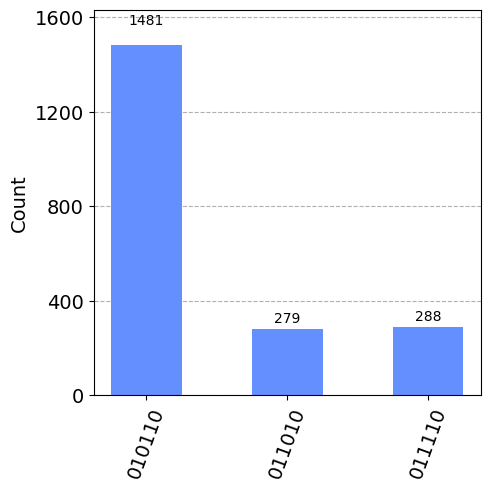

In [ ]:
backend = BasicAer.get_backend('qasm_simulator')
shots = 2048
results = execute(gc, backend=backend, shots=shots).result()
answer = results.get_counts()
plot_histogram(answer,figsize=(5, 5))

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import math

# importing Qiskit
from qiskit import QuantumCircuit, ClassicalRegister, QuantumRegister
from qiskit.visualization import plot_histogram

# --- Helper Functions ---
def r2(circ, x, y):
    circ.cp(-math.pi / 2, x, y)

def r3(circ, x, y, z):
    circ.cp(-math.pi / 4, x, z)
    r2(circ, y, z)

def r4(circ, w, x, y, z):
    circ.cp(-math.pi / 8, w, z)
    r3(circ, x, y, z)

def r5(circ, v, w, x, y, z):
    circ.cp(-math.pi / 16, v, z)
    r4(circ, w, x, y, z)

def r6(circ, u, v, w, x, y, z):
    circ.cp(-math.pi / 32, u, z)
    r5(circ, v, w, x, y, z)

def uni(circ, a, b, c, d, x, y, z):
    circ.cp(c - a, x, y)
    circ.p(a, x)
    circ.cp(b - a, x, z)
    circ.ccx(x, y, z)
    circ.cp((a + d - b - c) / 2, x, z)
    circ.ccx(x, y, z)
    circ.cp((a + d - b - c) / 2, x, y)
    circ.cp((a + d - b - c) / 2, x, z)

def bigU(circ, a, b, c, d, e, f, g, h, i, j, k, l, m, n, o, p, q, r, s, t, u):
    uni(circ, 0, a, b, c, m, n, o)
    uni(circ, d, 0, e, f, m, p, q)
    uni(circ, g, h, 0, i, m, r, s)
    uni(circ, j, k, l, 0, m, t, u)

def finU(circ, m, n, o, p, q, r, s, t, u):
    bigU(circ, 3*math.pi/32, 13*math.pi/32, 7*math.pi/16, 3*math.pi/32,
         3*math.pi/8, math.pi/8, 13*math.pi/32, 3*math.pi/8, math.pi/8,
         7*math.pi/16, math.pi/8, math.pi/8, m, n, o, p, q, r, s, t, u)

def finU2(circ, m, n, o, p, q, r, s, t, u):
    finU(circ, m, n, o, p, q, r, s, t, u)
    finU(circ, m, n, o, p, q, r, s, t, u)

def finU4(circ, m, n, o, p, q, r, s, t, u):
    finU2(circ, m, n, o, p, q, r, s, t, u)
    finU2(circ, m, n, o, p, q, r, s, t, u)

def finU8(circ, m, n, o, p, q, r, s, t, u):
    finU4(circ, m, n, o, p, q, r, s, t, u)
    finU4(circ, m, n, o, p, q, r, s, t, u)

def finU16(circ, m, n, o, p, q, r, s, t, u):
    finU8(circ, m, n, o, p, q, r, s, t, u)
    finU8(circ, m, n, o, p, q, r, s, t, u)

def finU32(circ, m, n, o, p, q, r, s, t, u):
    finU16(circ, m, n, o, p, q, r, s, t, u)
    finU16(circ, m, n, o, p, q, r, s, t, u)

def fU(circ, a, b, c, d, e, f, n, o, p, q, r, s, t, u):
    finU(circ, f, n, o, p, q, r, s, t, u)
    finU2(circ, e, n, o, p, q, r, s, t, u)
    finU4(circ, d, n, o, p, q, r, s, t, u)
    finU8(circ, c, n, o, p, q, r, s, t, u)
    finU16(circ, b, n, o, p, q, r, s, t, u)
    finU32(circ, a, n, o, p, q, r, s, t, u)

# --- Create the main quantum circuit ---
q = QuantumRegister(14, 'q')
c = ClassicalRegister(6, 'c')
qc = QuantumCircuit(q, c)

# Apply H gates
for i in range(1, 6):
    qc.h(q[i])

# Apply X gates
for i in [7, 8, 9, 11, 12, 13]:
    qc.x(q[i])

# Apply the big function
fU(qc, q[0], q[1], q[2], q[3], q[4], q[5],
   q[6], q[7], q[8], q[9], q[10], q[11], q[12], q[13])

# Apply QFT† (inverse QFT) on first 6 qubits
qc.h(q[0])
r2(qc, q[0], q[1])
qc.h(q[1])
r3(qc, q[0], q[1], q[2])
qc.h(q[2])
r4(qc, q[0], q[1], q[2], q[3])
qc.h(q[3])
r5(qc, q[0], q[1], q[2], q[3], q[4])
qc.h(q[4])
r6(qc, q[0], q[1], q[2], q[3], q[4], q[5])
qc.h(q[5])

# Measure
for i in range(6):
    qc.measure(q[i], c[i])

# Visualize the circuit
qc.draw(output='mpl')


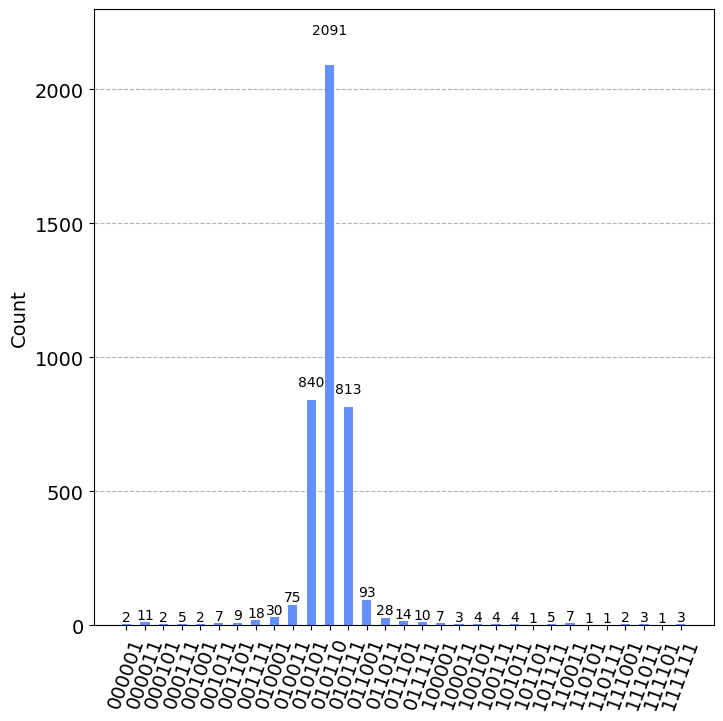

In [ ]:
backend = BasicAer.get_backend('qasm_simulator')
shots = 4096
results = execute(qc, backend=backend, shots=shots).result()
answer = results.get_counts()
plot_histogram(answer,figsize=(8, 8))

In [ ]:
qc.draw()

»
 q_0: ──────────────────────────────────────────────────────────────────────»
      ┌───┐                                                                 »
 q_1: ┤ H ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
 q_2: ┤ H ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
 q_3: ┤ H ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
 q_4: ┤ H ├─────────────────────────────────────────────────────────────────»
      ├───┤            ┌──────┐                                             »
 q_5: ┤ H ├─■──────────┤ P(0) ├─■─────────────■───■───────────■───■─────────»
      └───┘ │P(1.2763) └──────┘ │             │   │           │   │P(-π/32) »
 q_6: ──────■───────────────────┼─────────────■───┼───────────■───■─────────»
      ┌───┐                     │P(0.29452) ┌─┴─┐ │P(-π/32) ┌─┴─┐           »
 q_7: ┤ X ├─────────────────────■───────────┤ X ├─■─────────┤ X ├───────────»
      ├───┤                                 └───┘           └───┘           »
 q_8: ┤ X ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
 q_9: ┤ X ├─────────────────────────────────────────────────────────────────»
      └───┘                                                                 »
q_10: ──────────────────────────────────────────────────────────────────────»
      ┌───┐                                                                 »
q_11: ┤ X ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
q_12: ┤ X ├─────────────────────────────────────────────────────────────────»
      ├───┤                                                                 »
q_13: ┤ X ├─────────────────────────────────────────────────────────────────»
      └───┘                                                                 »
 c: 6/══════════════════════════════════════════════════════════════════════»
                                                                            »
«                                                                     »
« q_0: ───────────────────────────────────────────────────────────────»
«                                                                     »
« q_1: ───────────────────────────────────────────────────────────────»
«                                                                     »
« q_2: ───────────────────────────────────────────────────────────────»
«                                                                     »
« q_3: ───────────────────────────────────────────────────────────────»
«                                ┌──────┐                             »
« q_4: ────────────■─────────────┤ P(0) ├─────────────────■───────────»
«                  │             └──────┘  ┌────────────┐ │           »
« q_5: ─■──────────┼───────────■───────────┤ P(0.29452) ├─┼───────────»
«       │          │P(1.2763)  │           └────────────┘ │           »
« q_6: ─┼──────────■───────────┼──────────────────────────┼───────────»
«       │P(-π/32)              │                          │P(0.29452) »
« q_7: ─■──────────────────────┼──────────────────────────■───────────»
«                              │P(0.88357)                            »
« q_8: ────────────────────────■──────────────────────────────────────»
«                                                                     »
« q_9: ───────────────────────────────────────────────────────────────»
«                                                                     »
«q_10: ───────────────────────────────────────────────────────────────»
«                                                                     »
«q